In [46]:
import os
import cv2
import numpy as np
import albumentations as A
import xml.etree.ElementTree as ET
from tqdm import tqdm
import copy

In [97]:
BASE_DIR = 'dataset'
IMAGE_DIR = os.path.join(BASE_DIR, 'images')
ANNOTATION_PATH = os.path.join(BASE_DIR, 'annotations.xml')
OUTPUT_DIR = 'dataset-augmented'
NUM_AUGMENTATIONS_PER_IMAGE = 3

Funções de augumentação 

In [ ]:
def logarithmic_transform(image, **kwargs):
    c = np.random.uniform(40, 50)
    log_image = c * (np.log(image.astype(np.float32) + 1))
    log_image = np.clip(log_image, 0, 255)
    log_image = np.array(log_image, dtype=np.uint8)
    return log_image

def exponential_transform(image, **kwargs):
    gamma = np.random.uniform(0.7, 1.5)
    gamma_corrected = np.array(255 * (image / 255) ** gamma, dtype='uint8')
    return gamma_corrected

def random_mean_filter(image, **kwargs):
    kernel_size = int(np.random.choice([3, 5, 7]))
    blurred_image = cv2.blur(src=image, ksize=(kernel_size, kernel_size))
    return blurred_image

Definindo os pipelines com a biblioteca aulbumentations

In [ ]:
BBOX_PARAMS = A.BboxParams(
    format='pascal_voc',
    label_fields=['class_labels'],
    min_area=1,
    min_visibility=0.1
)

transform_pipeline = A.Compose([
    A.OneOf([
        A.Lambda(image=logarithmic_transform, name="logarithmic_transform"),
        A.Lambda(image=exponential_transform, name="exponential_transform"),
        A.Lambda(image=random_mean_filter, name="random_mean_filter"),
    ], p=1.0), # p=1.0 ensures one of the three is always chosen

    A.HorizontalFlip(p=0.5),

    A.ShiftScaleRotate(
        shift_limit=0.0625,  # Max percentage of image size to shift
        scale_limit=0.15,    # Max percentage to scale up or down
        rotate_limit=25,     # Max degrees to rotate
        p=0.7                # Probability of applying this transform
    ),

], bbox_params=BBOX_PARAMS)

/home/pras/UTPFR/PDI/trabalho-de-PDI/venv/lib/python3.10/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [109]:
def augment_dataset():
    print(f"Loading original annotations from: {ANNOTATION_PATH}")

    original_tree = ET.parse(ANNOTATION_PATH)
    original_root = original_tree.getroot()

    # Creating a new root element for the augmented dataset
    new_root = ET.Element(original_root.tag, original_root.attrib)
    new_root.extend(copy.deepcopy(original_root.findall('meta')))
    new_tree = ET.ElementTree(new_root)

    # Define and create output directories
    new_image_dir = os.path.join(OUTPUT_DIR, 'images')
    new_annotation_path = os.path.join(OUTPUT_DIR, 'annotation.xml')
    os.makedirs(new_image_dir, exist_ok=True)
    print(f"Augument saved to: {OUTPUT_DIR}/")

    original_images_nodes = list(original_root.findall('image'))
    new_image_id = 0

    # Loop original images
    for image_node in tqdm(original_images_nodes, desc="Augmenting Images"):
        image_name = image_node.get('name')
        image_path = os.path.join(IMAGE_DIR, image_name)
        image = cv2.imread(image_path)

        bboxes = []
        class_labels = []
        for box_node in image_node.findall('box'):
            bboxes.append([
                float(box_node.get('xtl')), float(box_node.get('ytl')),
                float(box_node.get('xbr')), float(box_node.get('ybr'))
            ])
            class_labels.append(box_node.get('label'))

        # Creating new augumented images
        for i in range(NUM_AUGMENTATIONS_PER_IMAGE):
            try:
                # Transform the image and bounding boxes
                transformed = transform_pipeline(image=image, bboxes=bboxes, class_labels=class_labels)
                transformed_image = transformed['image']
                transformed_bboxes = transformed['bboxes']

                base_name, extension = os.path.splitext(image_name)
                new_image_name = f"{base_name}-aug-{i+1}{extension}"
                cv2.imwrite(os.path.join(new_image_dir, new_image_name), transformed_image)

                # XML
                new_image_id += 1
                new_image_node = ET.Element('image', {
                    'id': str(new_image_id), 'name': new_image_name,
                    'width': image_node.get('width'), 'height': image_node.get('height')
                })

                if len(transformed_bboxes) > 0:
                    for j, bbox_coords in enumerate(transformed_bboxes):
                        xtl, ytl, xbr, ybr = bbox_coords
                        new_box_node = ET.SubElement(new_image_node, 'box', {
                            'label': transformed['class_labels'][j],
                            'xtl': f"{xtl:.2f}", 'ytl': f"{ytl:.2f}",
                            'xbr': f"{xbr:.2f}", 'ybr': f"{ybr:.2f}",
                            'occluded': '0', 'z_order': '0'
                        })
                new_root.append(new_image_node)

            except Exception as e:
                print(f"\nError during augmentation for {image_name} ( aug: {i+1}): {e}")

    # Save the final annotation file containing ONLY the augmented data
    ET.indent(new_tree, space="\t", level=0)
    new_tree.write(new_annotation_path)

    print(f"Created {new_image_id} new images.")

In [ ]:
augment_dataset()

Exibindo imagens

In [116]:
import matplotlib.pyplot as plt
import random
from skimage.util import montage

In [117]:
AUGMENTED_DIR = 'dataset-augmented'
ANNOTATION_PATH = os.path.join(AUGMENTED_DIR, 'annotation.xml')
IMAGE_DIR = os.path.join(AUGMENTED_DIR, 'images')
NUM_IMAGES_TO_PLOT = 6

In [122]:
def plot_augmented_images():
    tree = ET.parse(ANNOTATION_PATH)
    root = tree.getroot()

    all_image_nodes = root.findall('image')

    # num_to_sample =  len(all_image_nodes)
    image_nodes_to_plot = all_image_nodes
    
    images_with_boxes = []
    for image_node in image_nodes_to_plot:
        image_name = image_node.get('name')
        image_path = os.path.join(IMAGE_DIR, image_name)

        image = cv2.imread(image_path)

        for box_node in image_node.findall('box'):
            label = box_node.get('label')
            xtl = int(float(box_node.get('xtl')))
            ytl = int(float(box_node.get('ytl')))
            xbr = int(float(box_node.get('xbr')))
            ybr = int(float(box_node.get('ybr')))
            
            cv2.rectangle(image, (xtl, ytl), (xbr, ybr), color=(255, 0, 0), thickness=2)
            
            text = f"{label}"
            (text_width, text_height), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
            cv2.rectangle(image, (xtl, ytl - text_height - 5), (xtl + text_width, ytl), (255, 0, 0), -1)
            cv2.putText(image, text, (xtl, ytl - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images_with_boxes.append(image_rgb)

    montage_arr = montage(images_with_boxes, channel_axis=-1, padding_width=10)

    plt.figure(figsize=(30, 50))
    plt.imshow(montage_arr)
    plt.title(f"Montage of {len(images_with_boxes)} Augmented Images")
    plt.axis('off')
    plt.show()

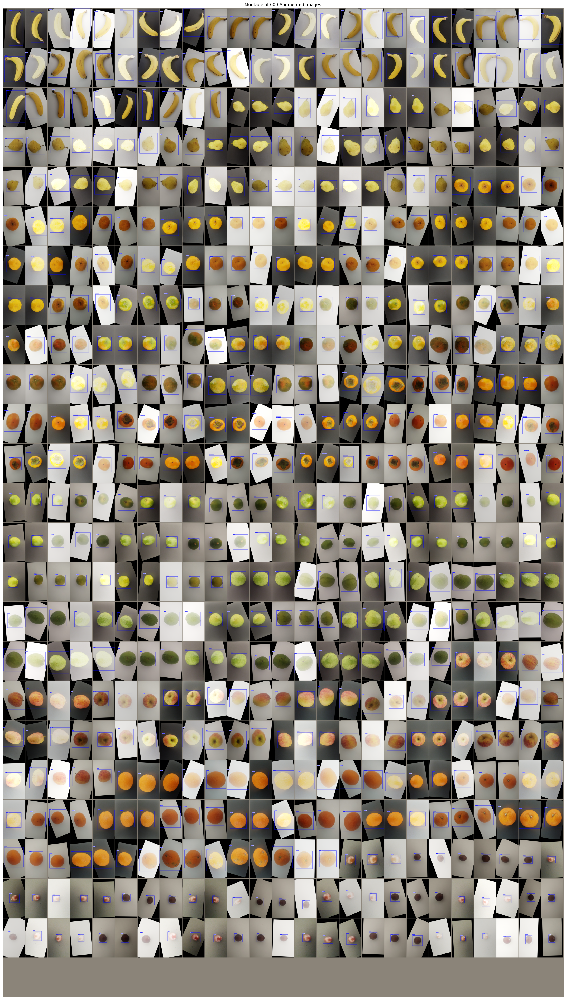

In [123]:
plot_augmented_images()